# First part : Opening and studying one file

In [47]:
import pyablo #required only to read Dyablo Snapshots
import numpy as np
import matplotlib.pyplot as plt
from configparser import ConfigParser
from CosmoUtils import *
import h5py
import utils

gamma=1.66666666666666666666#5./3.#1.666#5.0/3.0

In [48]:
plt.style.use('stylesheet.mplstyle')

In [49]:
path='/home/mesquita/dyablo/run/out/'
prefix='cosmo'
t=8500 #iteration, arbitrary

In [50]:
reader = pyablo.XdmfReader()

# Read snapshot
snap = reader.readSnapshot(path + 'cosmo_iter{:07d}.xmf'.format(t)) 

# Read ini file
conf = utils.read_config(path + 'last.ini')
pos = 62 

mask = snap.getSortingMask3d(conf["lmin"], conf["bx"], conf["by"], conf["bz"], conf["cor_x"], conf["cor_y"], conf["cor_z"])
ext = np.array([conf["xmin"], conf["xmax"], conf["zmin"], conf["zmax"]])


Reading :  /home/mesquita/dyablo/run/out/last.ini


In [51]:
zre = np.array(snap.readAllFloat('zre'))[mask].reshape((conf["Nz"], conf["Ny"], conf["Nx"]))

xe = np.array(snap.readAllFloat('xe'))[mask].reshape((conf["Nz"], conf["Ny"], conf["Nx"]))

The ionization fraction of a slice of the arbitrary iteration

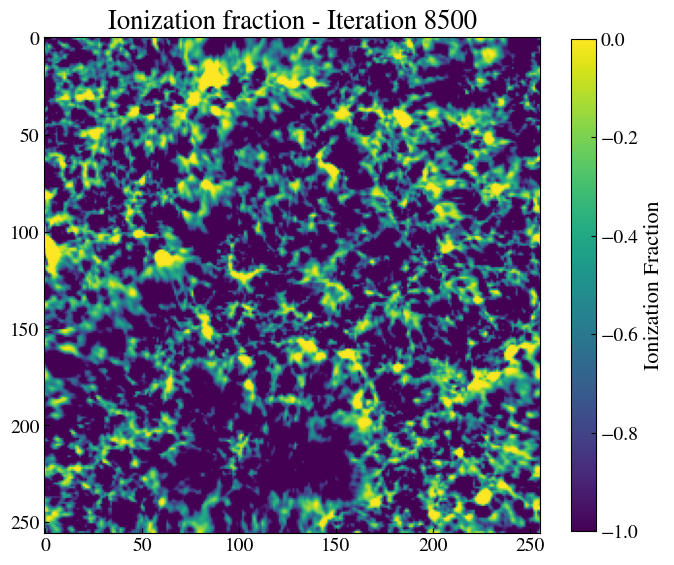

In [52]:
plt.figure(figsize=(8,8))
# plt.imshow(np.log10(1-xe[pos,:,:]))

im = plt.imshow(np.log10(xe[pos, :, :]),vmin=-1, vmax=0)
plt.title(f'Ionization fraction - Iteration {t}')

cbar = plt.colorbar(im,shrink=0.8)
# cbar.ax.set_yticklabels(['1e-8', '1e-6', '1e-4', '1e-2', '1'])  # Linear scale labels
cbar.set_label('Ionization Fraction')

# Second part : Generalizing

In [53]:
om = 0.3175
H0 = 67.0 # H0 in km/s/Mpc
mpc_to_m = 3.1e22
H0SI = H0 * 1000 / mpc_to_m  
G = 6.67430e-11 # Gravitational constant in m^3 kg^-1 s^-2
rho_mean = om * H0SI**2 / (8 * np.pi * G)  # kg/m^3

In [54]:
from astropy.cosmology import FlatLambdaCDM
from astropy import units as u

def compute_age_yr(z, H0=H0, om=om):
    """
    H0 in km/s/Mpc
    """
    H0_astropy = H0 * u.km / u.s / u.Mpc
    cosmo = FlatLambdaCDM(H0=H0_astropy, Om0=om)
    age = cosmo.age(z).to(u.yr).value
    return age

Reading the log.txt file and extracting for each iteration the corresponding redshift

In [55]:
iterations = [0]
z_values = [26]
times = [-6.65543e+18]
filename = "/home/mesquita/dyablo/run/log.txt"

with open(filename, "r") as f:
    for line in f:
        if ("Output" in line or "Final" in line) and ("iter=" in line or "z=" in line):
            parts = line.split()
            iter_part = next((s for s in parts if s.startswith("iter=")), None)
            z_part = next((s for s in parts if s.startswith("z=")), None)
            time_part = next((s for s in parts if s.startswith("time=")), None)
            if iter_part and z_part and time_part:
                iteration = int(iter_part.split("=")[1])
                z = float(z_part.split("=")[1])
                time = float(time_part.split("=")[1])
                iterations.append(iteration)
                z_values.append(z)
                times.append(time)
                
z_values = np.array(z_values)
iterations = np.array(iterations)

Extracting for each saved iterations 3 values :
* Ionization fraction in each cell
* Mass density in each cell
* Stellar mass density in each cell

In [56]:
xe_list = []
rho_star = []
rho_list = []

for cur_iter,z in zip(iterations,z_values):
    print(f"Processing iteration {cur_iter} with redshift {z}")
    reader = pyablo.XdmfReader()

    snap = reader.readSnapshot(path + 'cosmo_iter{:07d}.xmf'.format(cur_iter)) 

    # Read ini file
    conf = utils.read_config(path + 'last.ini')
    pos = 62 

    mask = snap.getSortingMask3d(conf["lmin"], conf["bx"], conf["by"], conf["bz"], conf["cor_x"], conf["cor_y"], conf["cor_z"])
    ext = np.array([conf["xmin"], conf["xmax"], conf["zmin"], conf["zmax"]])
    
    rho_star_elt = np.array(snap.readAllFloat('zre'))[mask].reshape((conf["Nz"], conf["Ny"], conf["Nx"]))
    rho_star.append(rho_star_elt)
    
    xe_elt = np.array(snap.readAllFloat('xe'))[mask].reshape((conf["Nz"], conf["Ny"], conf["Nx"]))
    xe_list.append(xe_elt)
    
    rho_elt = np.array(snap.readAllFloat('rho'))[mask].reshape((conf["Nz"], conf["Ny"], conf["Nx"]))
    rho_list.append(rho_elt)

rho_star = np.array(rho_star)
xe_list = np.array(xe_list)
rho_list = np.array(rho_list)

Processing iteration 0 with redshift 26.0
Reading :  /home/mesquita/dyablo/run/out/last.ini
Processing iteration 500 with redshift 23.9973
Reading :  /home/mesquita/dyablo/run/out/last.ini
Processing iteration 1000 with redshift 22.1047
Reading :  /home/mesquita/dyablo/run/out/last.ini
Processing iteration 1500 with redshift 20.42
Reading :  /home/mesquita/dyablo/run/out/last.ini
Processing iteration 2000 with redshift 18.9125
Reading :  /home/mesquita/dyablo/run/out/last.ini
Processing iteration 2500 with redshift 17.5589
Reading :  /home/mesquita/dyablo/run/out/last.ini
Processing iteration 3000 with redshift 16.3388
Reading :  /home/mesquita/dyablo/run/out/last.ini
Processing iteration 3500 with redshift 15.2349
Reading :  /home/mesquita/dyablo/run/out/last.ini
Processing iteration 4000 with redshift 14.2332
Reading :  /home/mesquita/dyablo/run/out/last.ini
Processing iteration 4500 with redshift 13.3215
Reading :  /home/mesquita/dyablo/run/out/last.ini
Processing iteration 5000 wit

## Ionization fraction

Plotting the evolution of the average ionization fraction as a function of redshift

In [57]:
mean_xe = np.mean(xe_list, axis=(1, 2, 3))
std_xe = np.std(xe_list, axis=(1, 2, 3))

In [58]:
mark_size = 8

<>:2: SyntaxWarning: invalid escape sequence '\s'
<>:2: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_1400433/156082624.py:2: SyntaxWarning: invalid escape sequence '\s'
  plt.fill_between(z_values, mean_xe - std_xe, mean_xe + std_xe, color="grey", alpha=0.3, label = "$3\sigma$ dispersion")


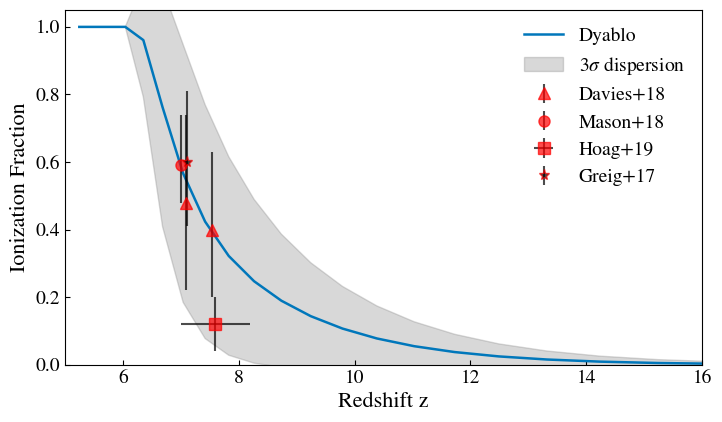

In [59]:
plt.plot(z_values, mean_xe, label="Dyablo", lw=1.8)
plt.fill_between(z_values, mean_xe - std_xe, mean_xe + std_xe, color="grey", alpha=0.3, label = "$3\sigma$ dispersion")

# plt.errorbar(7.09, 0.48, yerr=[[0.26],[0.26]], color = "darkred", alpha=0.7, markersize=mark_size, fmt="^", label="Davies et al. 2018")
# plt.errorbar(7.54, 1-0.60, yerr=[[0.20],[0.23]], color = "darkred", alpha=0.7, markersize=mark_size, fmt="^")
# plt.errorbar(7,0.59, yerr=[[0.11],[0.15]], color = "darkred", alpha=0.7, markersize=mark_size, fmt="o", label="Mason et al. 2018")
# plt.errorbar(7.6, 1-0.88, yerr=[[0.08],[0.08]],xerr=[[0.6],[0.6]], color = "darkred", alpha=0.7, markersize=mark_size, fmt="s", label="Hoag et al. 2019")
# plt.errorbar(7.1, 1-0.4, yerr=[[0.19],[0.21]],color = "darkred", alpha=0.7, markersize=6, fmt="+", label="Greig et al. 2017")

plt.errorbar(7.09, 0.48, yerr=[[0.26],[0.26]], fmt="^", color="black", ecolor="black", markerfacecolor="red", markeredgecolor="red", alpha=0.7, markersize=mark_size, label="Davies+18")
plt.errorbar(7.54, 1-0.60, yerr=[[0.20],[0.23]], fmt="^", color="black", ecolor="black", markerfacecolor="red", markeredgecolor="red", alpha=0.7, markersize=mark_size)
plt.errorbar(7, 0.59, yerr=[[0.11],[0.15]], fmt="o", color="black", ecolor="black", markerfacecolor="red", markeredgecolor="red", alpha=0.7, markersize=mark_size, label="Mason+18")
plt.errorbar(7.6, 1-0.88, yerr=[[0.08],[0.08]], xerr=[[0.6],[0.6]], fmt="s", color="black", ecolor="black", markerfacecolor="red", markeredgecolor="red", alpha=0.7, markersize=mark_size, label="Hoag+19")
plt.errorbar(7.1, 1-0.4, yerr=[[0.19],[0.21]], fmt="*", color="black", ecolor="black", markeredgecolor="red", alpha=0.7, markersize=mark_size, label="Greig+17")


plt.xlabel('Redshift z')
plt.ylabel('Ionization Fraction')
# plt.title('Average of the ionization fraction as a function of redshift')

plt.ylim(0.,1.05)
plt.xlim(5,16)
#plt.xlim(5,11)
plt.legend()
plt.tight_layout()
plt.savefig('../saved_results/xe_plots/xe_vs_z.pdf', dpi=300, bbox_inches='tight')
plt.show()

In [60]:
xe_at_1 = np.where(np.mean(xe_list, axis=(1,2,3)) > 0.9)[0]
if len(xe_at_1) > 0:
    xe_at_1 = xe_at_1[0]
    end_reio = z_values[xe_at_1]
    print(f"End of reio at z = {end_reio}")

End of reio at z = 6.35499


## SFR

In [61]:
time_deltas = [compute_age_yr(z_values[i + 1]) - compute_age_yr(z_values[i]) for i in range(len(times) - 1)]
time_deltas = np.array(time_deltas)

sfr_per_dt = [rho_star[i+1] - rho_star[i] for i in range(len(rho_star) - 1)]
sfr_per_dt = np.array(sfr_per_dt)

In [62]:
# Time between each iterations in Myr
time_deltas[:, np.newaxis, np.newaxis, np.newaxis] / 1e6

array([[[[15.08177013]]],


       [[[17.31702785]]],


       [[[18.69647785]]],


       [[[20.14618947]]],


       [[[21.6390842 ]]],


       [[[23.1875418 ]]],


       [[[24.79662452]]],


       [[[26.45196948]]],


       [[[28.15906442]]],


       [[[29.92777891]]],


       [[[31.74472709]]],


       [[[33.61260221]]],


       [[[35.54386855]]],


       [[[37.52862458]]],


       [[[39.55352176]]],


       [[[41.6481226 ]]],


       [[[43.78724324]]],


       [[[45.98333445]]],


       [[[48.23558069]]],


       [[[50.53864498]]],


       [[[52.89852874]]],


       [[[55.30969691]]],


       [[[57.78201438]]],


       [[[60.30117267]]],


       [[[62.88165613]]],


       [[[57.62809513]]]])

In [63]:
sfr_per_yr = sfr_per_dt / time_deltas[:, np.newaxis, np.newaxis, np.newaxis]

In [64]:
kg_to_msun = 1 / 1.98847e30
m3_to_mpc3 = (3.085677581e22)**3

sfr_converted = sfr_per_yr * kg_to_msun * m3_to_mpc3  #  Msun / yr / Mpc^3

<>:22: SyntaxWarning: invalid escape sequence '\l'
<>:22: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_1400433/899537545.py:22: SyntaxWarning: invalid escape sequence '\l'
  plt.ylabel('$\log_{10}(SFR)\ [yr^{-1}Mpc^{-3} M_\odot]$')


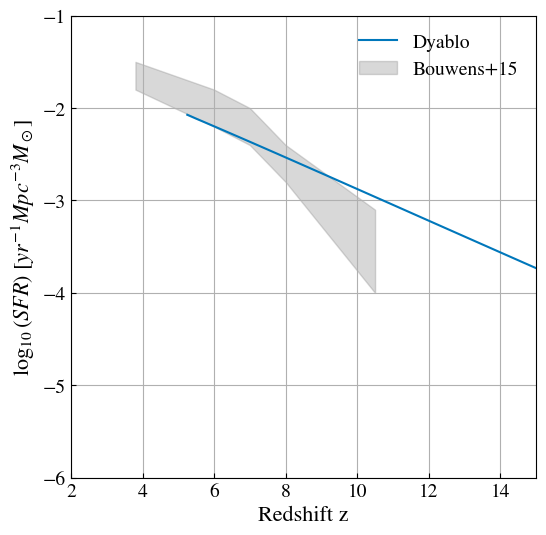

In [65]:
plt.figure(figsize=(6,6))

plt.plot(z_values[1:], np.log10(np.mean(sfr_converted, axis=(1,2,3))), label="Dyablo")

bouwnens15 = [[3.8, [-1.5,-1.8]],
              [6.0, [-1.8,-2.2]],
              [7.0, [-2.0,-2.4]],
              [8.0, [-2.4,-2.8]],
              [10.5, [-3.1,-4.0]]]

x_b15 = [point[0] for point in bouwnens15]
y1_b15 = [point[1][0] for point in bouwnens15]
y2_b15 = [point[1][1] for point in bouwnens15]

plt.fill_between(x_b15, y1_b15, y2_b15, color='grey', alpha=0.3, label='Bouwens+15')


plt.xlim(2,15)
plt.ylim(-6,-1)

plt.xlabel('Redshift z')
plt.ylabel('$\log_{10}(SFR)\ [yr^{-1}Mpc^{-3} M_\odot]$')
# plt.title('SFR(z)')
plt.grid()
plt.legend()
plt.savefig('../saved_results/sfr_vs_z.pdf', dpi=300, bbox_inches='tight')

plt.show()

## Plot ionization fraction and density of ionized gas for all snapshots

In [74]:
dnl_list = rho_list / rho_mean - 1 
dnl_xe = dnl_list * xe_list

In [75]:
rhoxe = rho_list * xe_list

In [76]:
zre_list = rho_star

In [77]:
vmin_zre = np.min(zre_list)
vmax_zre = np.max(zre_list)

vmin_rhoxe = np.min(rhoxe)
vmax_rhoxe = np.max(rhoxe)

vmin_dnlxe = np.min(dnl_xe)
vmax_dnlxe = np.max(dnl_xe)

print(f"vmin_zre = {vmin_zre}, vmax_zre = {vmax_zre}, mean_zre = {np.mean(zre_list)}")
print(f"vmin_rhoxe = {vmin_rhoxe}, vmax_rhoxe = {vmax_rhoxe}, mean_rhoxe = {np.mean(rhoxe)}")
print(f"vmin_dnlxe = {vmin_dnlxe}, vmax_dnlxe = {vmax_dnlxe}, mean_dnlxe = {np.mean(dnl_xe)}")

vmin_zre = 0.0, vmax_zre = 3.210553805316134e-29, mean_zre = 4.3339237295983684e-32
vmin_rhoxe = 0.0, vmax_rhoxe = 9.291564105286435e-27, mean_rhoxe = 1.3275984963382218e-28
vmin_dnlxe = -0.9578756383146347, vmax_dnlxe = 9.509075337644953, mean_dnlxe = -0.1442470562859518


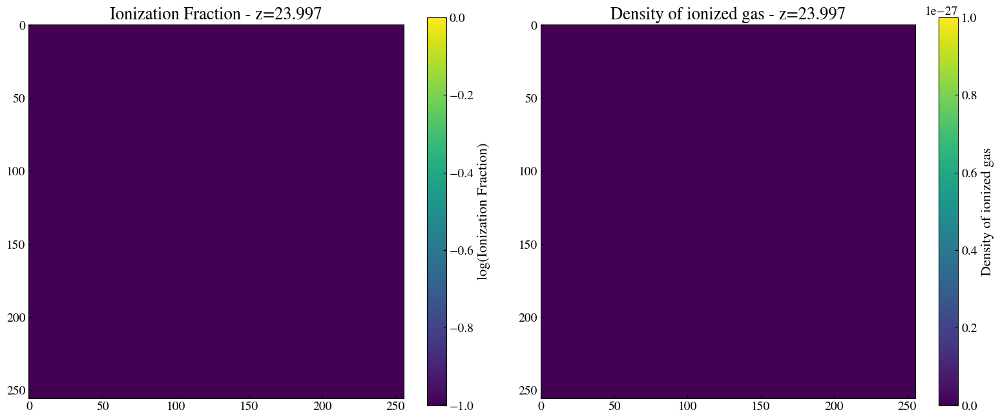

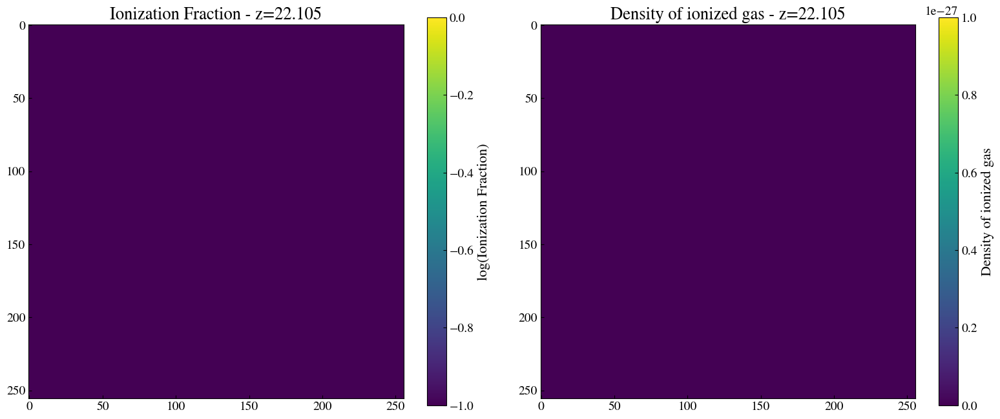

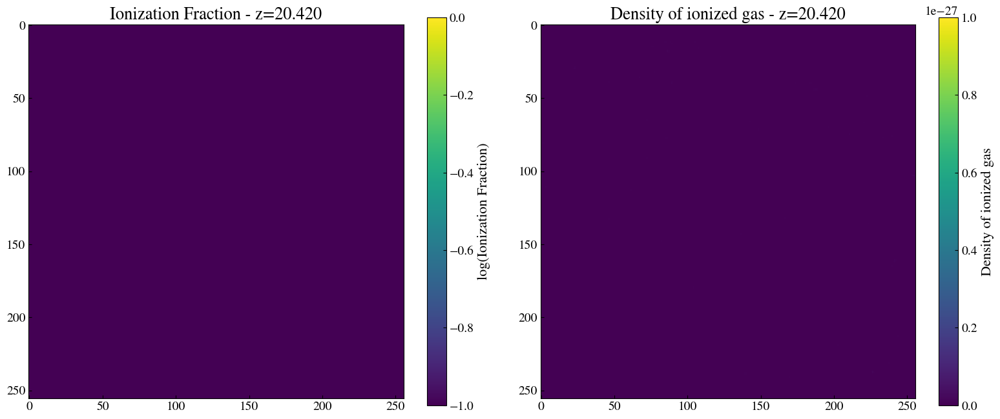

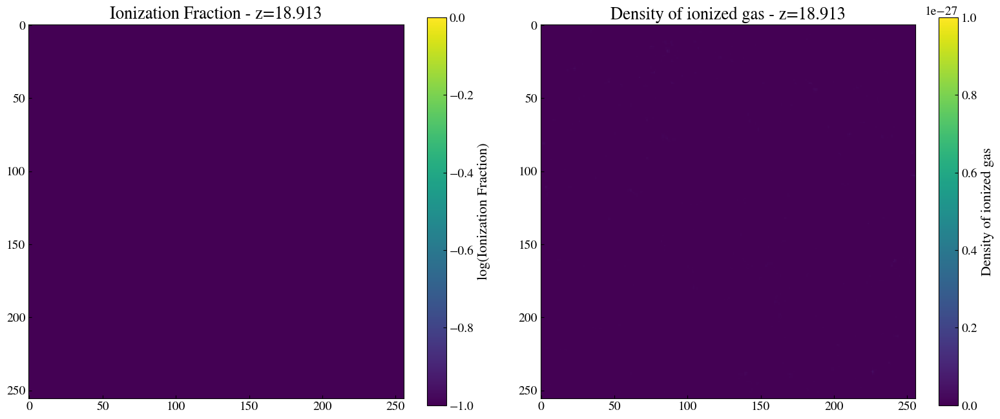

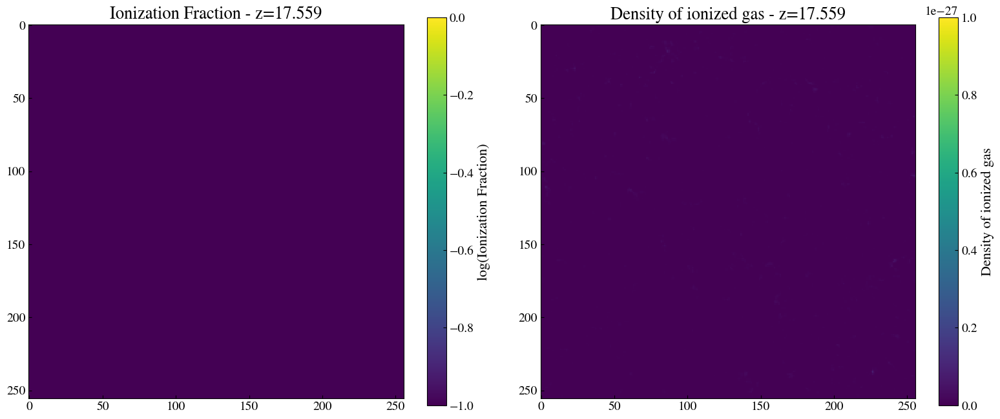

...

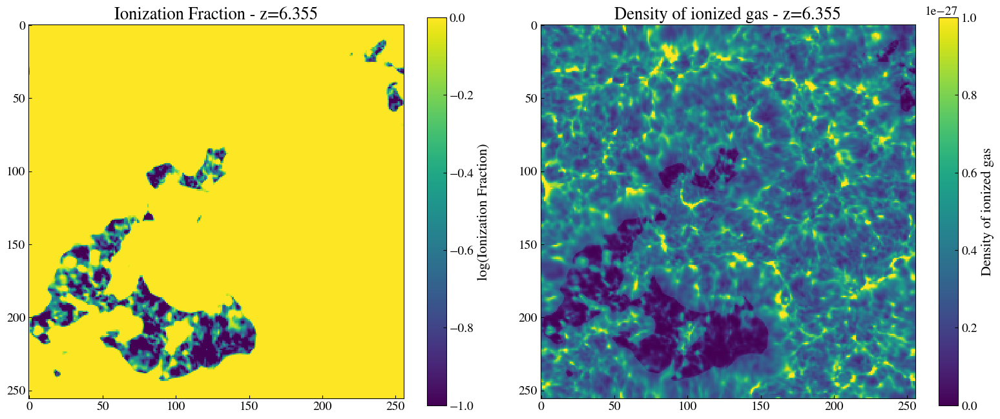

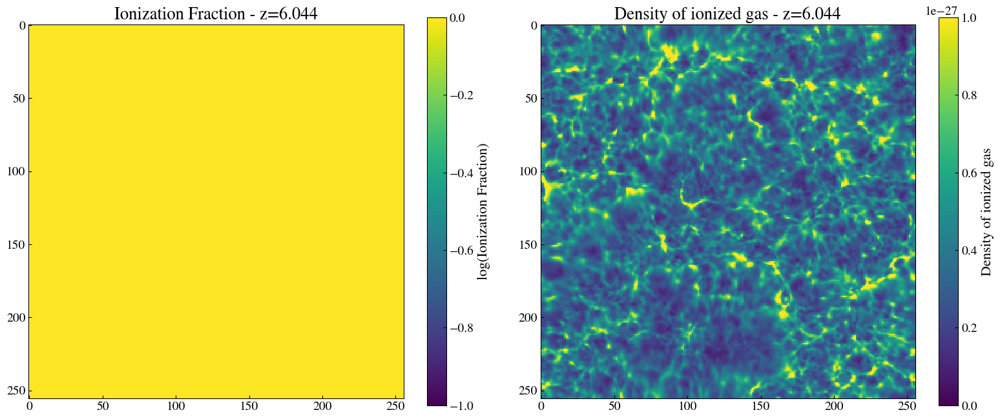

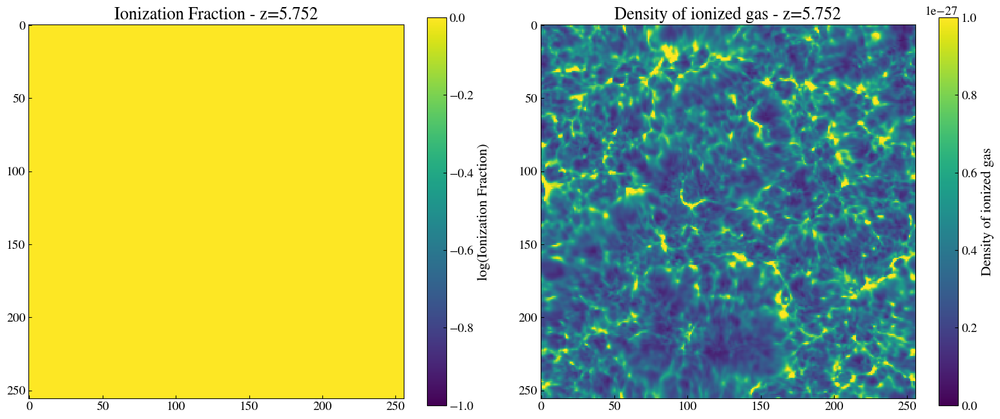

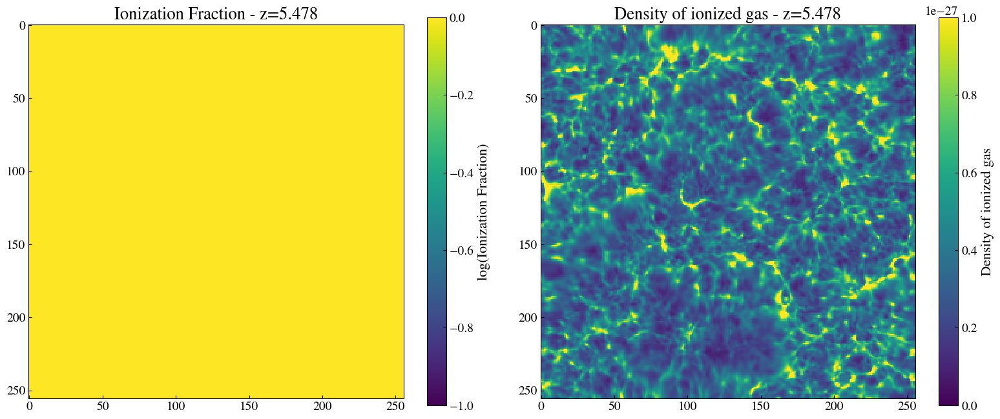

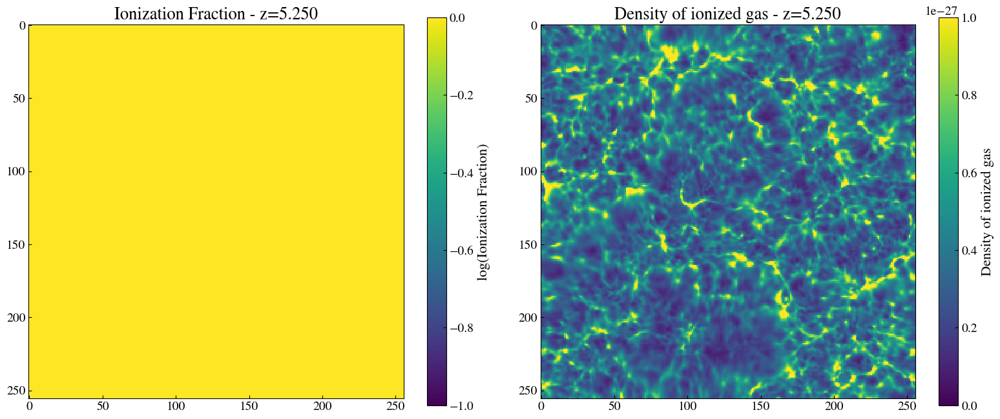

In [78]:
for i in range(1,len(xe_list)):
    fig, ax = plt.subplots(1, 2, figsize=(16, 8))  

    im_xe = ax[0].imshow(np.log10(xe_list[i][pos, :, :]), vmin=-1, vmax=0, interpolation='none')
    # im_xe = ax[0].imshow(np.max(xe_list[i], axis=0), vmin=0, vmax=1)
    ax[0].set_title(f'Ionization Fraction - z={z_values[i]:.3f}')
    cbar1 = fig.colorbar(im_xe, ax=ax[0], shrink=0.8)
    # cbar1.ax.set_yticklabels(['0', '1'])
    cbar1.set_label('log(Ionization Fraction)')
    
    # im_zre = ax[1].imshow(np.log10((zre_list[i][pos, :, :])), vmin=vmin_zre, vmax=vmax_zre)
    im2 = ax[1].imshow(rhoxe[i][pos, :, :], vmin=vmin_rhoxe, vmax=1e-27, interpolation='none')
    ax[1].set_title(f'Density of ionized gas - z={z_values[i]:.3f}')
    cbar2 = fig.colorbar(im2, ax=ax[1], shrink=0.8)
    cbar2.set_label('Density of ionized gas')

    plt.tight_layout()
    # plt.savefig(f'../saved_results/xe_plots/xe{z_values[i]:.2f}.pdf', dpi=300, bbox_inches='tight')
    plt.show()

# Only one plot

In [79]:
plot_plots = True
save_plots = True

In [80]:
i_nice = [7,10,13,15,17,19,20,21,23]

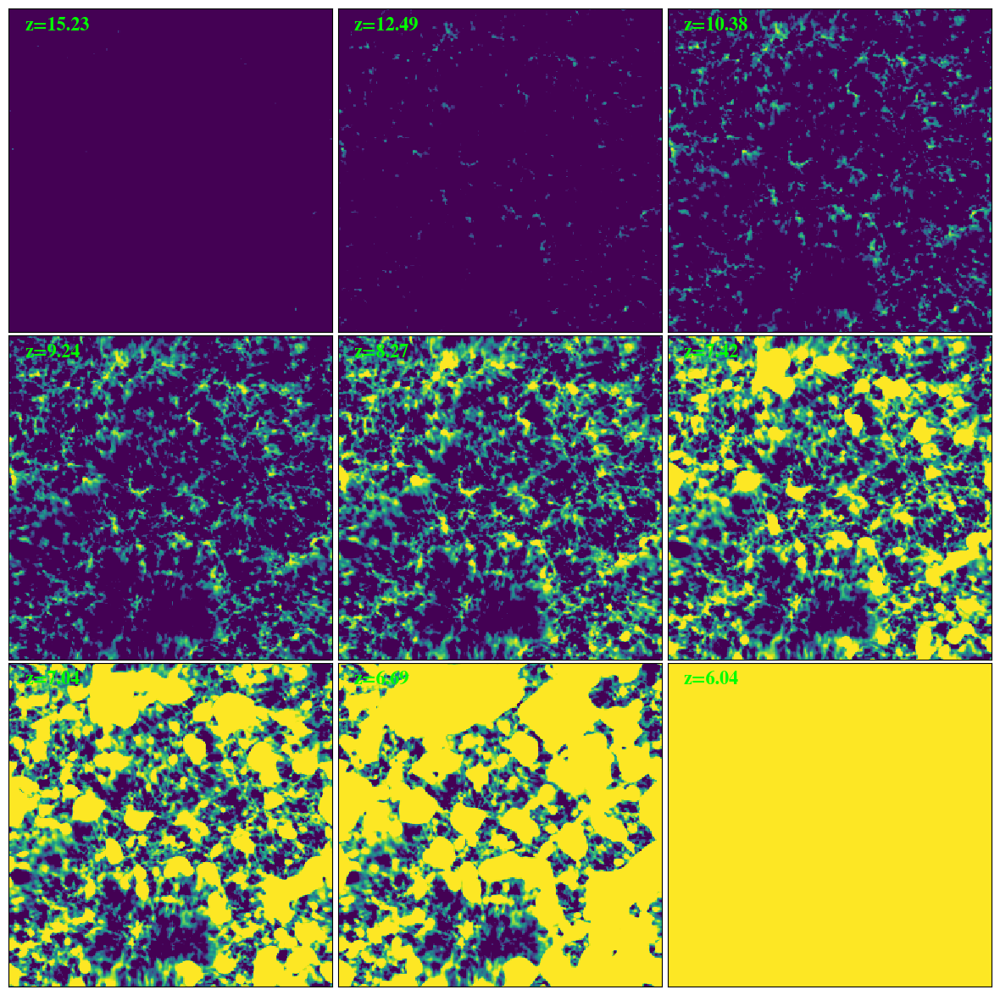

In [81]:
if plot_plots:
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))  # 3x3 grid
    axes = axes.flatten()  # Flatten for easy iteration

    for idx, i in enumerate(i_nice):  # i_nice has 9 elements
        ax = axes[idx]
        im_xe = ax.imshow(np.log10(xe_list[i][pos, :, :]), vmin=-1, vmax=0, interpolation='none', rasterized=True) #

        # Title in bold bright green at top right
        ax.text(0.05, 0.92, f'z={z_values[i]:.2f}', transform=ax.transAxes,
                ha='left', va='bottom', fontsize=16, fontweight='bold', color='lime')

        ax.set_xticks([])
        ax.set_yticks([])

    # plt.tight_layout()
    fig.subplots_adjust(wspace=0.01, hspace=0.01)  # Adjust spacing between plots
    if save_plots:
        plt.savefig(f'../saved_results/xe_plots/xe_grid.pdf', dpi=300, bbox_inches='tight')

    plt.show()


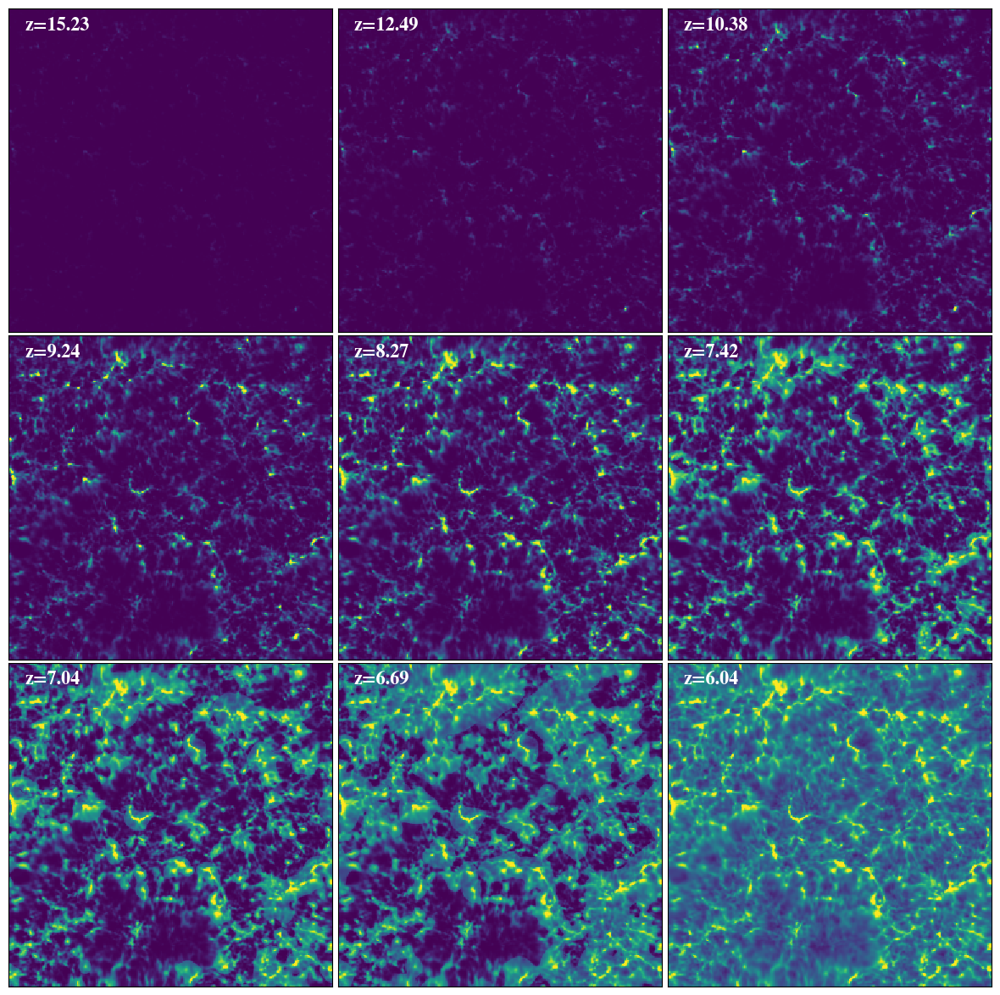

In [82]:
if plot_plots:
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))  # 3x3 grid
    axes = axes.flatten()  # Flatten for easy iteration

    for idx, i in enumerate(i_nice):  # i_nice has 9 elements
        ax = axes[idx]
        im_xe = ax.imshow(rhoxe[i][pos,:,:],  vmin=vmin_rhoxe, vmax=1e-27, interpolation='none', rasterized=True) #vmin=-1, vmax=0,

        # Title in bold bright green at top right
        ax.text(0.05, 0.92, f'z={z_values[i]:.2f}', transform=ax.transAxes,
                ha='left', va='bottom', fontsize=16, fontweight='bold', color='white')

        ax.set_xticks([])
        ax.set_yticks([])

    # plt.tight_layout()
    fig.subplots_adjust(wspace=0.01, hspace=0.01)  # Adjust spacing between plots
    if save_plots:
        plt.savefig(f'../saved_results/xe_plots/rhoxe_grid.pdf', dpi=300, bbox_inches='tight')

    plt.show()
